# Setup

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/

/content/drive/MyDrive


In [ ]:
import numpy as np
from numpy import array
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import string
import os
from PIL import Image
import glob
from pickle import dump, load
from time import time
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization
from keras.optimizers import Adam, RMSprop
from keras.layers.wrappers import Bidirectional
from keras.layers.merge import add
from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing import image
from keras.models import Model
from keras import Input, layers
from keras import optimizers
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

# Load and preprocess Flickr dataset

In [ ]:
# load doc into memory
def load_doc(filename):
	# open the file as read only
	file = open(filename, 'r')
	# read all text
	text = file.read()
	# close the file
	file.close()
	return text

filename = "dataset/TextFiles/Flickr8k.token.txt"
# load descriptions
doc = load_doc(filename)
print(doc[:300])

1000268201_693b08cb0e.jpg#0	A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg#1	A girl going into a wooden building .
1000268201_693b08cb0e.jpg#2	A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg#3	A little girl climbing the s


In [ ]:
def load_descriptions(doc):
	mapping = dict()
	# process lines
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		if len(line) < 2:
			continue
		# take the first token as the image id, the rest as the description
		image_id, image_desc = tokens[0], tokens[1:]
		# extract filename from image id
		image_id = image_id.split('.')[0]
		# convert description tokens back to string
		image_desc = ' '.join(image_desc)
		# create the list if needed
		if image_id not in mapping:
			mapping[image_id] = list()
		# store description
		mapping[image_id].append(image_desc)
	return mapping

# parse descriptions
descriptions = load_descriptions(doc)
print('Loaded: %d ' % len(descriptions))

Loaded: 8092 


# Load and preprocess Senticap dataset

In [ ]:
import json
senticap_file = "/content/drive/MyDrive/baseline/senticap_dataset.json"
scap = json.load(open(senticap_file, "r"))
s_images_path = "/content/drive/MyDrive/CS685/val2014"

In [ ]:
#for Senticap
s_descriptions = dict()

In [ ]:
#for Senticap
#img0['filename'].split(".")[0]
#for sent in img0['sentences']:
#  print(sent['raw'])

desc = {}
img_id_set = set()
for img in scap['images']:
#if img['split'] == 'train':
  l = list()
  for sent in img['sentences']:
    l.append(sent['raw'])
  desc[img['filename'].split(".")[0]] = l
  img_id_set.add(img['filename'].split(".")[0])

In [ ]:
s_descriptions = desc

In [ ]:
def clean_descriptions(descriptions):
	# prepare translation table for removing punctuation
	table = str.maketrans('', '', string.punctuation)
	for key, desc_list in descriptions.items():
		for i in range(len(desc_list)):
			desc = desc_list[i]
			# tokenize
			desc = desc.split()
			# convert to lower case
			desc = [word.lower() for word in desc]
			# remove punctuation from each token
			desc = [w.translate(table) for w in desc]
			# remove hanging 's' and 'a'
			desc = [word for word in desc if len(word)>1]
			# remove tokens with numbers in them
			desc = [word for word in desc if word.isalpha()]
			# store as string
			desc_list[i] =  ' '.join(desc)

# clean descriptions
clean_descriptions(descriptions)
clean_descriptions(s_descriptions)

In [ ]:
# convert the loaded descriptions into a vocabulary of words
def to_vocabulary(descriptions):
	# build a list of all description strings
	all_desc = set()
	for key in descriptions.keys():
		[all_desc.update(d.split()) for d in descriptions[key]]
	return all_desc

# summarize vocabulary
# vocabulary = to_vocabulary(descriptions)
vocabulary = to_vocabulary(s_descriptions)
print('Original Vocabulary Size: %d' % len(vocabulary))

Original Vocabulary Size: 4665


In [ ]:
# save descriptions to file, one per line
def save_descriptions(descriptions, filename):
	lines = list()
	for key, desc_list in descriptions.items():
		for desc in desc_list:
			lines.append(key + ' ' + desc)
	data = '\n'.join(lines)
	file = open(filename, 'w')
	file.write(data)
	file.close()

save_descriptions(descriptions, 'descriptions.txt')
save_descriptions(s_descriptions, 's_descriptions.txt')

In [ ]:
# load a pre-defined list of photo identifiers
def load_set(filename):
	doc = load_doc(filename)
	dataset = list()
	# process line by line
	for line in doc.split('\n'):
		# skip empty lines
		if len(line) < 1:
			continue
		# get the image identifier
		identifier = line.split('.')[0]
		dataset.append(identifier)
	return set(dataset)

# load training dataset (6K)
filename = 'dataset/TextFiles/Flickr_8k.trainImages.txt'
train = load_set(filename)
print('Dataset: %d' % len(train))

Dataset: 6000


In [ ]:
#for Senticap
s_train = img_id_set
print('S_Dataset: %d' % len(s_train))

S_Dataset: 2225


# Load and preprocess Images

In [ ]:
# Below path contains all the images
images = 'dataset/Flicker8k_Dataset/'
s_images = '/content/drive/MyDrive/CS685/val2014/'
# Create a list of all image names in the directory
img = glob.glob(images + '*.jpg')
s_img = glob.glob(s_images + '*.jpg')

In [ ]:
# Below file conatains the names of images to be used in train data
train_images_file = 'dataset/TextFiles/Flickr_8k.trainImages.txt'
# Read the train image names in a set
train_images = set(open(train_images_file, 'r').read().strip().split('\n'))

# Create a list of all the training images with their full path names
train_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in train_images: # Check if the image belongs to training set
        train_img.append(i) # Add it to the list of train images

In [ ]:
#for Senticap
s_train_img = []
for i in scap['images']:
  if i['split'] == 'train':
    s_train_img.append(s_images+i['filename'])
len(s_train_img)
print(s_train_img[0])

/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000389081.jpg


In [ ]:
# Below file conatains the names of images to be used in test data
test_images_file = 'dataset/TextFiles/Flickr_8k.testImages.txt'
# Read the validation image names in a set# Read the test image names in a set
test_images = set(open(test_images_file, 'r').read().strip().split('\n'))

# Create a list of all the test images with their full path names
test_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in test_images: # Check if the image belongs to test set
        test_img.append(i) # Add it to the list of test images

In [ ]:
#for Senticap
s_test_img = []
for i in scap['images']:
  if i['split'] == 'test':
    s_test_img.append(s_images+i['filename'])
print(len(s_test_img))
print(s_test_img[0])

878
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000497106.jpg


In [ ]:
# load clean descriptions into memory
def load_clean_descriptions(filename, dataset):
	# load document
	doc = load_doc(filename)
	descriptions = dict()
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		# split id from description
		image_id, image_desc = tokens[0], tokens[1:]
		# skip images not in the set
		if image_id in dataset:
			# create list
			if image_id not in descriptions:
				descriptions[image_id] = list()
			# wrap description in tokens
			desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
			# store
			descriptions[image_id].append(desc)
	return descriptions

# descriptions
train_descriptions = load_clean_descriptions('descriptions.txt', train)
s_train_descriptions = load_clean_descriptions('s_descriptions.txt', s_train)
print('Descriptions: train=%d' % len(train_descriptions))
print('Descriptions: s_train=%d' % len(s_train_descriptions))

Descriptions: train=6000
Descriptions: s_train=2225


In [ ]:
def preprocess(image_path):
    # Convert all the images to size 299x299 as expected by the inception v3 model
    img = image.load_img(image_path, target_size=(299, 299))
    # Convert PIL image to numpy array of 3-dimensions
    x = image.img_to_array(img)
    # Add one more dimension
    x = np.expand_dims(x, axis=0)
    # preprocess the images using preprocess_input() from inception module
    x = preprocess_input(x)
    return x

# Load InceptionV3 model

In [ ]:
# Load the inception v3 model
model = InceptionV3(weights='imagenet')

In [ ]:
# Create a new model, by removing the last layer (output layer) from the inception v3
model_new = Model(model.input, model.layers[-2].output)

In [ ]:
# Function to encode a given image into a vector of size (2048, )
def encode(image):
    image = preprocess(image) # preprocess the image
    fea_vec = model_new.predict(image) # Get the encoding vector for the image
    fea_vec = np.reshape(fea_vec, fea_vec.shape[1]) # reshape from (1, 2048) to (2048, )
    return fea_vec

In [ ]:
#CALLED ONCE
# Call the funtion to encode all the train images
# This will take a while on CPU - Execute this only once
# start = time()
# encoding_train = {}
# for img in train_img:
#     encoding_train[img[len(images):]] = encode(img)
# print("Time taken in seconds =", time()-start)

In [ ]:
len(s_train_img)

1217

In [ ]:
# #For Senticap
# #CALLED ONCE
# # Call the funtion to encode all the train images
# # This will take a while on CPU - Execute this only once
# start = time()
# encoding_train = {}
# for s_img in s_train_img:
#     encoding_train[s_img[len(s_images):]] = encode(s_img)
# print("Time taken in seconds =", time()-start)

# Load encoded images

In [ ]:
%ls -al dataset/Pickle/

total 72499
-r-------- 1 root root  8284163 Dec  2 17:10 encoded_test_images.pkl
-r-------- 1 root root 49708076 Dec  2 17:03 encoded_train_images.pkl
-r-------- 1 root root  6158113 Dec  3 09:17 s_encoded_test_images.pkl
-r-------- 1 root root 10087101 Dec  3 08:08 s_encoded_train_images.pkl


In [ ]:
# Save the bottleneck train features to disk
with open("dataset/Pickle/s_encoded_train_images.pkl", "wb") as encoded_pickle:
    dump(encoding_train, encoded_pickle)

In [ ]:
# Call the funtion to encode all the test images - Execute this only once
start = time()
encoding_test = {}
for img in s_test_img:
    encoding_test[img[len(s_images):]] = encode(img)
print("Time taken in seconds =", time()-start)

In [ ]:
# Save the bottleneck test features to disk
with open("dataset/Pickle/s_encoded_test_images.pkl", "wb") as encoded_pickle:
    dump(encoding_test, encoded_pickle)

In [ ]:
train_features = load(open("dataset/Pickle/encoded_train_images.pkl", "rb"))
s_train_features = load(open("dataset/Pickle/s_encoded_train_images.pkl", "rb"))
print('Photos: s_train=%d' % len(s_train_features))

Photos: s_train=1217


# Create Vocab



In [ ]:
# Create a list of all the training captions
s_all_train_captions = []
for key, val in train_descriptions.items():
    for cap in val:
        s_all_train_captions.append(cap)
len(s_all_train_captions)

30000

In [ ]:
# Consider only words which occur at least 10 times in the corpus
# word_count_threshold = 10
# word_counts = {}
# nsents = 0
# for sent in all_train_captions:
#     nsents += 1
#     for w in sent.split(' '):
#         word_counts[w] = word_counts.get(w, 0) + 1

# vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]
# print('preprocessed words %d -> %d' % (len(word_counts), len(vocab)))
word_count_threshold = 10
word_counts = {}
nsents = 0
for sent in s_all_train_captions:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1

vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]
print('preprocessed words %d -> %d' % (len(word_counts), len(vocab)))

preprocessed words 7578 -> 1651


In [ ]:
ixtoword = {}
wordtoix = {}

ix = 1
for w in vocab:
    wordtoix[w] = ix
    ixtoword[ix] = w
    ix += 1

In [ ]:
vocab_size = len(ixtoword) + 1 # one for appended 0's
vocab_size

1652

In [ ]:
# convert a dictionary of clean descriptions to a list of descriptions
def to_lines(descriptions):
	all_desc = list()
	for key in descriptions.keys():
		[all_desc.append(d) for d in descriptions[key]]
	return all_desc

# calculate the length of the description with the most words
def max_length(descriptions):
	lines = to_lines(descriptions)
	return max(len(d.split()) for d in lines)

# determine the maximum sequence length
# max_length = max_length(train_descriptions)
max_length = max_length(s_train_descriptions)
print('Description Length: %d' % max_length)

Description Length: 89


In [ ]:
# data generator, intended to be used in a call to model.fit_generator()
def data_generator(descriptions, photos, wordtoix, max_length, num_photos_per_batch):
    X1, X2, y = list(), list(), list()
    n=0
    # loop for ever over images
    while 1:
        for key, desc_list in descriptions.items():
            n+=1
            # retrieve the photo feature
            photo = photos[key+'.jpg']
            for desc in desc_list:
                # encode the sequence
                seq = [wordtoix[word] for word in desc.split(' ') if word in wordtoix]
                # split one sequence into multiple X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pair
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    # store
                    X1.append(photo)
                    X2.append(in_seq)
                    y.append(out_seq)
            # yield the batch data
            if n==num_photos_per_batch:
                yield [array(X1), array(X2)], array(y)
                X1, X2, y = list(), list(), list()
                n=0

In [ ]:
# Load Glove vectors
glove_dir = 'dataset/glove'
embeddings_index = {} # empty dictionary
f = open(os.path.join(glove_dir, 'glove.6B.200d.txt'), encoding="utf-8")

for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


In [ ]:
embedding_dim = 200

# Get 200-dim dense vector for each of the 10000 words in out vocabulary
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, i in wordtoix.items():
    #if i < max_words:
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in the embedding index will be all zeros
        embedding_matrix[i] = embedding_vector

In [ ]:
embedding_matrix.shape

(1652, 200)

In [ ]:
for i in s_descriptions.items():
  print(i)
  break

('COCO_val2014_000000389081', ['plate of delicious food including french fries', 'french fries are not healthy food but it is an excellent food for teenagers', 'the plate has one of my favorite foods on it french fries', 'it was disgusting food not just bad food', 'plate of disgusting food found at diner', 'the meat on the burger looks like disgusting food'])


# Build and training model

In [ ]:
inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2)
se2 = Dropout(0.5)(se1)
se3 = LSTM(256)(se2)
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)
model = Model(inputs=[inputs1, inputs2], outputs=outputs)

In [ ]:
model.summary()

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 89)]         0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 2048)]       0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 89, 200)      330400      input_4[0][0]                    
__________________________________________________________________________________________________
dropout_2 (Dropout)             (None, 2048)         0           input_3[0][0]                    
_______________________________________________________________________________________

In [ ]:
model.layers[2]

In [ ]:
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer='adam')

In [ ]:
epochs = 10
number_pics_per_batch = 3
steps = len(s_train_descriptions)//number_pics_per_batch

In [ ]:
# model.load_weights('ICDl/model_weights/model_30.h5')
%ls /content/drive/MyDrive/CS685/val2014/ | grep 27517

COCO_val2014_000000027517.jpg
COCO_val2014_000000127517.jpg
COCO_val2014_000000275175.jpg


In [ ]:
len(s_train_features.keys())
len(s_train_descriptions.keys())

2225

In [ ]:
for i in range(epochs):
    generator = data_generator(s_train_descriptions, s_train_features, wordtoix, max_length, number_pics_per_batch)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model.save('ICDl/senticap/model_weights/model_' + str(i) + '.h5')

In [ ]:
for i in range(epochs):
    generator = data_generator(s_train_descriptions, s_train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model.save('ICDl/senticap/model_weights/model_' + str(i) + '.h5')

In [ ]:
model.optimizer.lr = 0.0001
epochs = 10
number_pics_per_batch = 6
steps = len(s_train_descriptions)//number_pics_per_bath

In [ ]:
for i in range(epochs):
    generator = data_generator(s_train_descriptions, s_train_features, wordtoix, max_length, number_pics_per_batch)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    #model.save('./model_weights/model_' + str(i) + '.h5')

In [ ]:
model.save_weights('ICDl/senticap/model_weights/model_30.h5')

# Load saved model and testing

In [ ]:
model.load_weights('ICDl/model_weights/model_30.h5')

In [ ]:
images = 'dataset/Flicker8k_Dataset/'

In [ ]:
with open("dataset/Pickle/s_encoded_test_images.pkl", "rb") as encoded_pickle:
    encoding_test = load(encoded_pickle)

In [ ]:
def greedySearch(photo):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

In [ ]:
z = 1

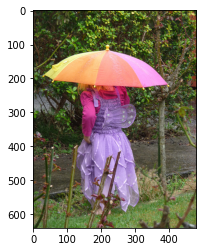

Greedy: the little girl is wearing red dress and holding pink toy


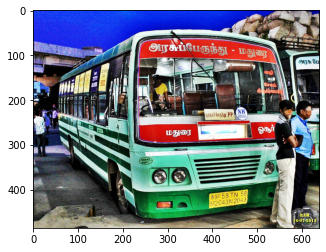

Greedy: two women in red are standing in front of large red bus


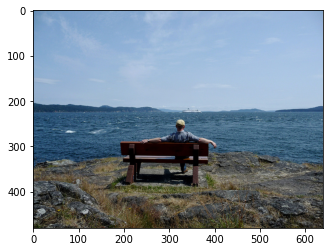

Greedy: man and woman sit on bench overlooking the water


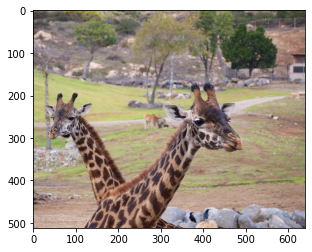

Greedy: two dogs are running through field of grass


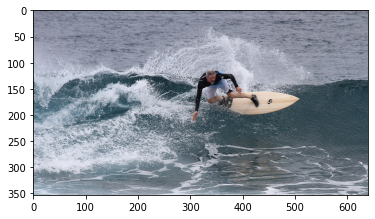

Greedy: man in yellow kayak is paddling through the water


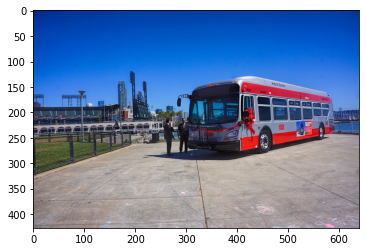

Greedy: two women in red are standing in front of large white and blue


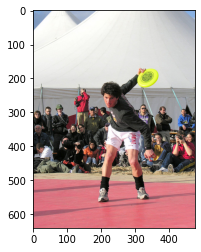

Greedy: two men in white are playing basketball


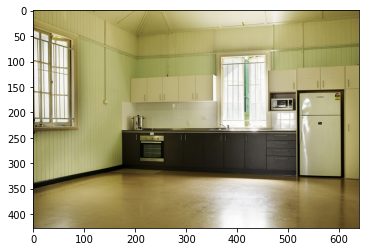

Greedy: man in blue shirt is laying on the ground with his arms outstretched


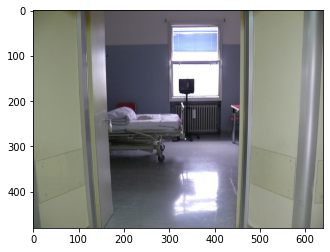

Greedy: man in blue shirt is sitting on bench with his shoes off


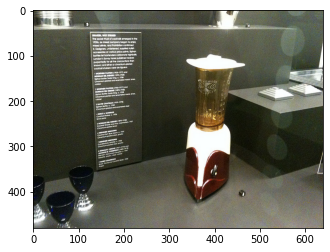

Greedy: man in blue shirt is sitting on the ground next to woman in black shirt


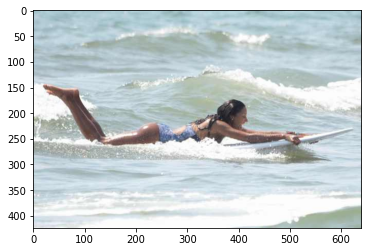

Greedy: man in wetsuit is surfing in the ocean


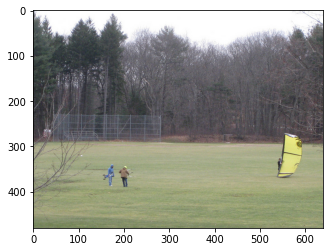

Greedy: man in harness rolling backwards backwards catching frisbee


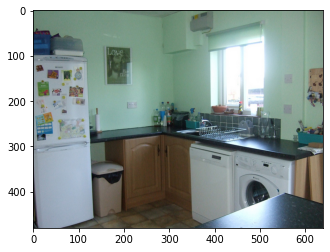

Greedy: two women in coats are standing in front of large white


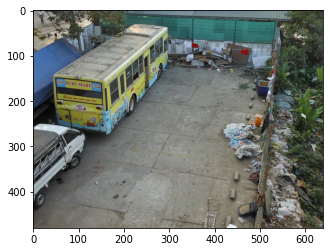

Greedy: two people are walking towards the camera in front of large red truck


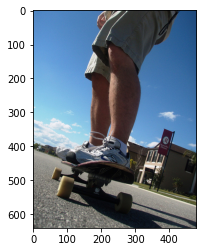

Greedy: young boy jumping in the air on skateboard


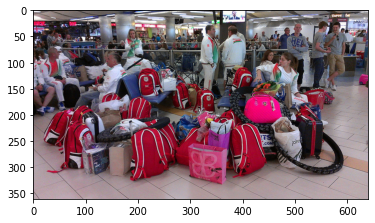

Greedy: two people are riding on bicycles in front of large building


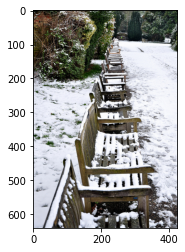

Greedy: two people are walking along the side of the ocean


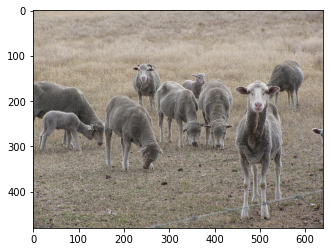

Greedy: two dogs are running through field of grass


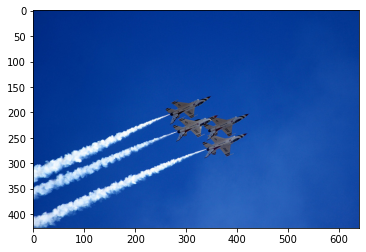

Greedy: plane is smoke on the ground


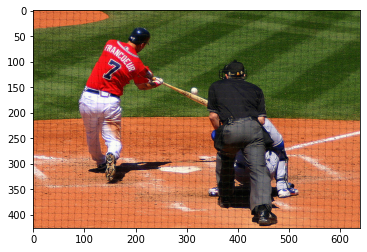

Greedy: boy in red shirt and blue shorts playing baseball


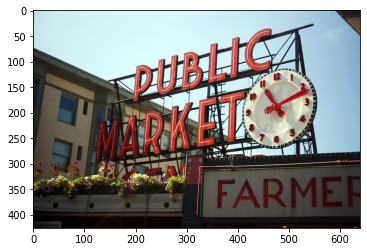

Greedy: man in black shirt is standing in front of crowd


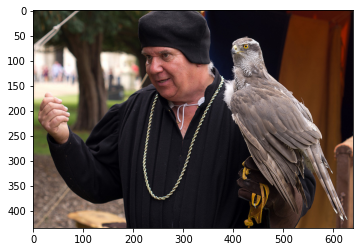

Greedy: man in blue shirt is holding up sign for the camera


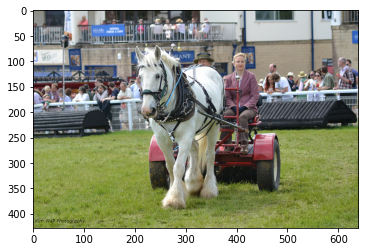

Greedy: man in blue shirt and jeans is riding brown horse


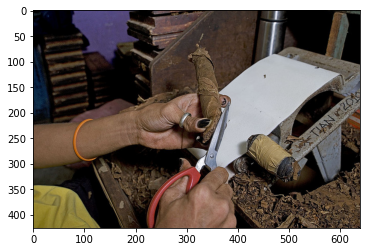

Greedy: man in blue shirt is sitting on bed with small dog


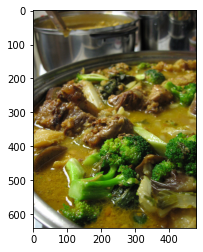

Greedy: dog is running through the grass


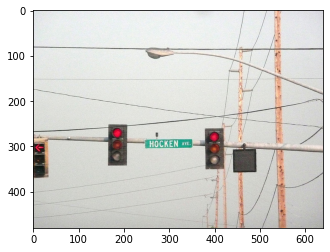

Greedy: man in blue shirt is standing in front of white building with his legs hanging out


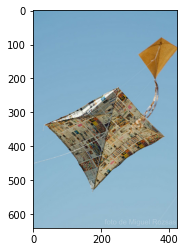

Greedy: man in red shirt is standing in front of yellow building


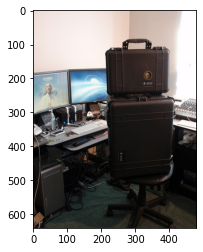

Greedy: man in blue shirt is laying on the ground with his dog in the background


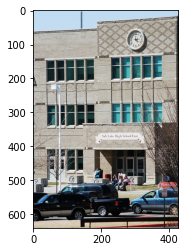

Greedy: two people are standing in front of an market


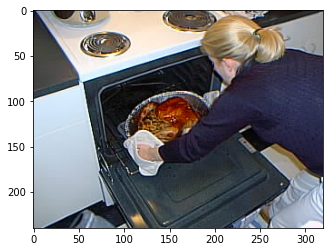

Greedy: man in blue shirt is sitting in room reading book


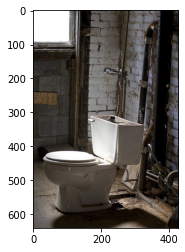

Greedy: man in blue shirt is sitting on wooden bench


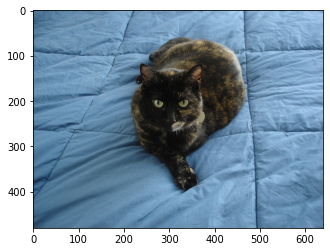

Greedy: two children are playing with toilet paper


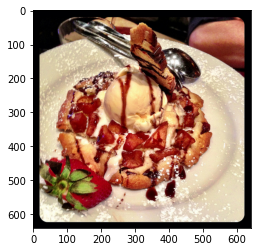

Greedy: two puppies are playing with toy


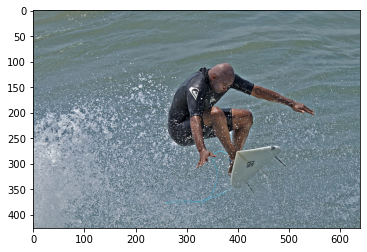

Greedy: man in wetsuit is surfing in the ocean


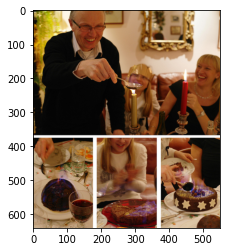

Greedy: man and woman are sitting at table with


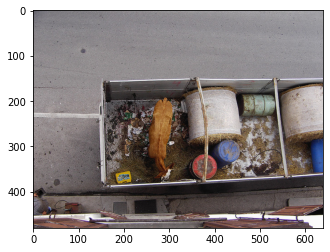

Greedy: man in blue shirt is sitting on the ground next to wooden bench


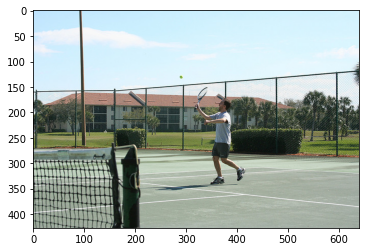

Greedy: boy in red shirt is jumping off the concrete stairs


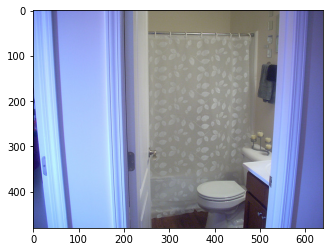

Greedy: two children are playing with plastic toy


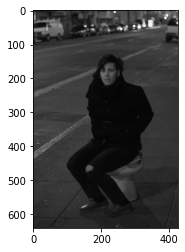

Greedy: boy in red shirt and blue jeans is jumping off of concrete wall


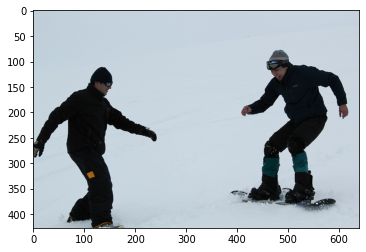

Greedy: two people in summer clothing are skiing in the snow


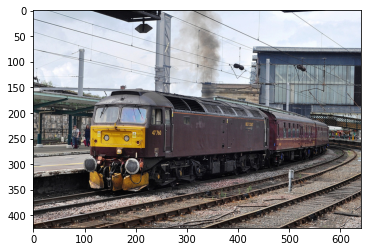

Greedy: two dogs are running through the grass


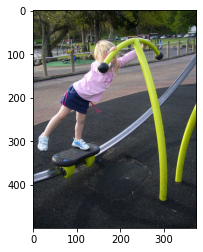

Greedy: young boy wearing red shirt is jumping off of the red slide


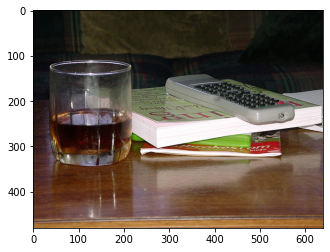

Greedy: man in blue shirt is sitting in front of restaurant


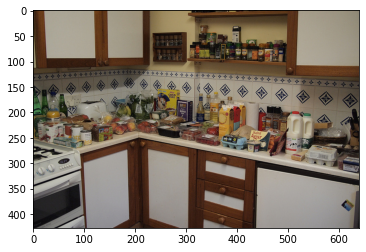

Greedy: man in blue shirt is eating plate of


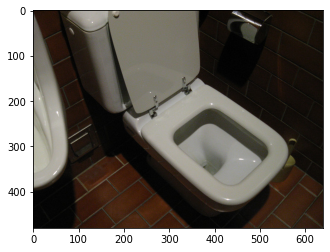

Greedy: two girls are sitting on the ground with their arms outstretched


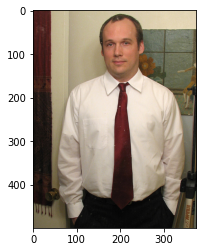

Greedy: man in black shirt and glasses is smiling at the camera


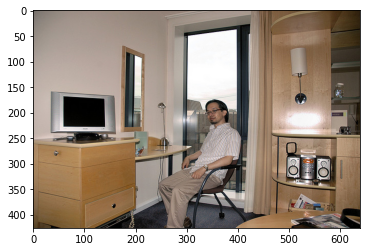

Greedy: woman in black shirt is sitting on the ground next to her


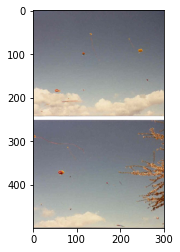

Greedy: hang on beach


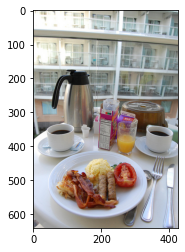

Greedy: man in blue shirt is holding up drink in his hand


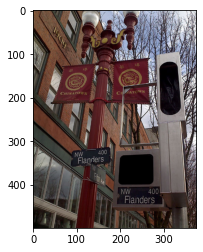

Greedy: man in blue shirt is standing in front of white building with his arms out


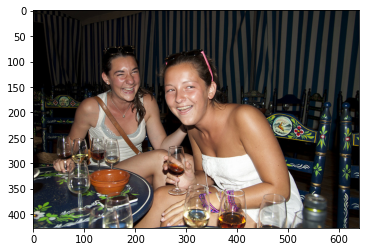

Greedy: two women in black are standing in front of an audience


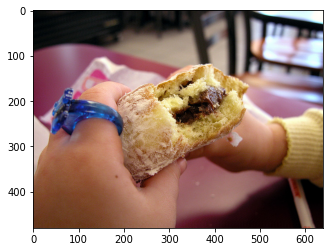

Greedy: man in blue shirt is sitting in front of white building with his hand in the air


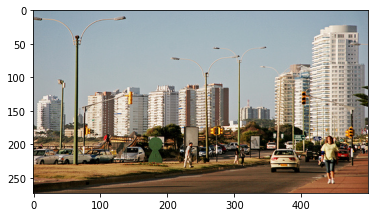

Greedy: two people are walking towards the street in front of large red truck


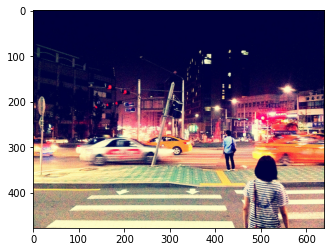

Greedy: woman in red jacket walks down the street


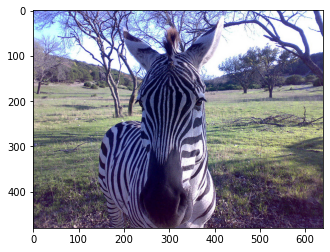

Greedy: two dogs are running towards the camera


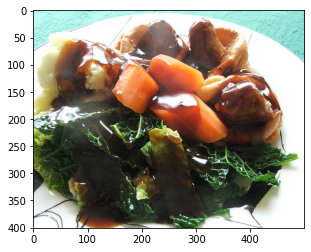

Greedy: man in black shirt is eating something off of boat


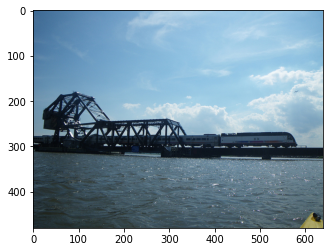

Greedy: man in red shirt is standing in front of some rocks


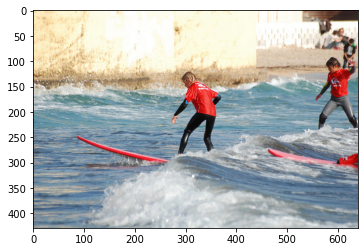

Greedy: man in yellow kayak is paddling through the water


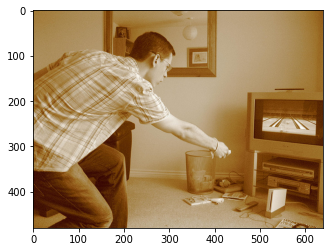

Greedy: the little boy is sitting on the bed with his tongue sticking out


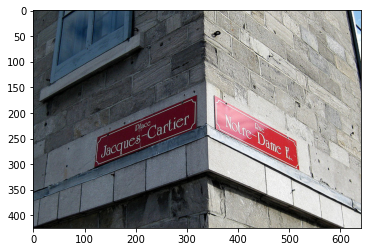

Greedy: man in blue shirt and jeans is standing on the sidewalk


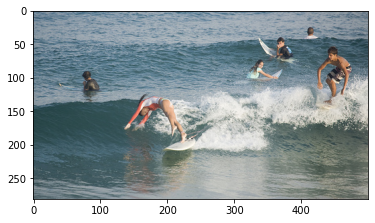

Greedy: surfer rides wave


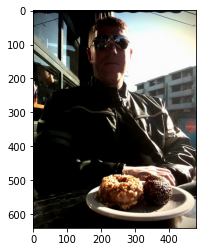

Greedy: man in black shirt and glasses is sitting in room reading book


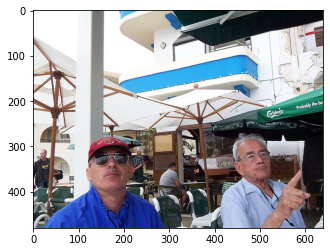

Greedy: man in black shirt is standing in front of restaurant


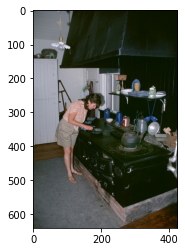

Greedy: man in blue shirt is sitting on the ground next to woman in black shirt


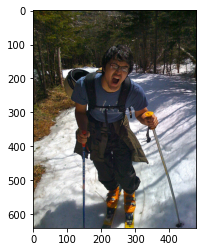

Greedy: man in red jacket is skiing down hill


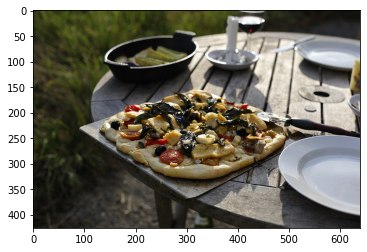

Greedy: two boys are playing with toy swords


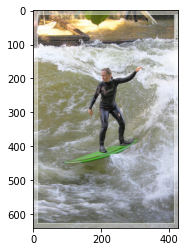

Greedy: man in wetsuit surfing


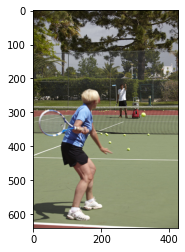

Greedy: man in blue shirt and blue shorts kicking tennis ball


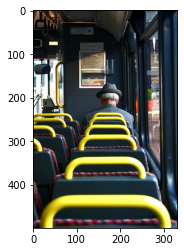

Greedy: two people are sitting in chairs and smile


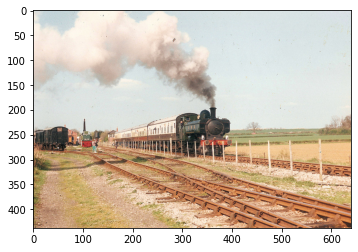

Greedy: the dog is wearing red hat and putting on top of the bed


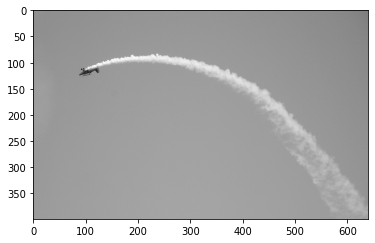

Greedy: man in red shirt is riding red and black parachute


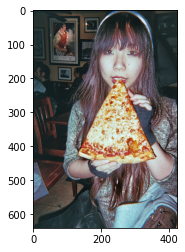

Greedy: the little girl is wearing pink hat and holding pink ribbon


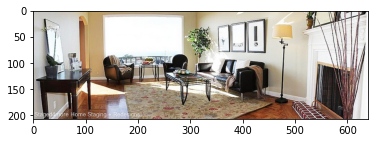

Greedy: two people are sitting on bench outside


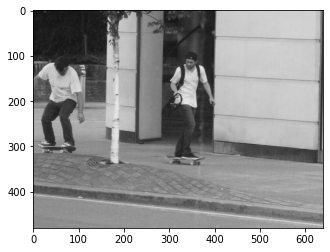

Greedy: two people are walking down the street


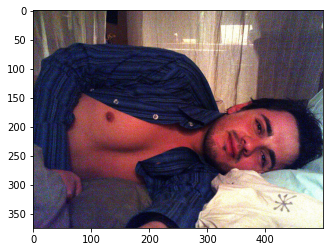

Greedy: two young girls are sitting on bed with adults


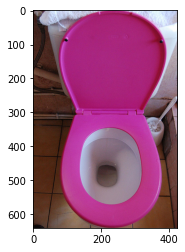

Greedy: two girls are playing with


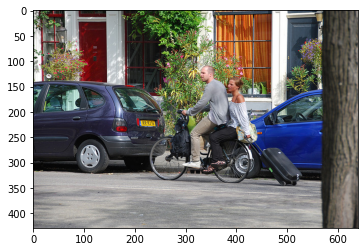

Greedy: man in blue shirt and blue shirt is riding bike


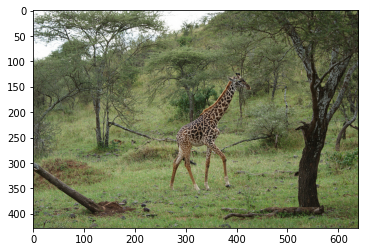

Greedy: two dogs are running through the grass


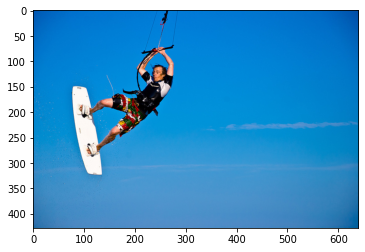

Greedy: man is suspended on ski


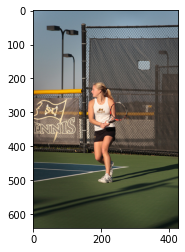

Greedy: man in white shirt is playing tennis


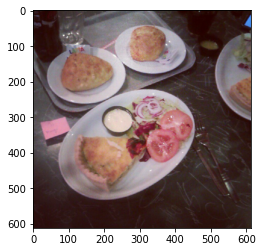

Greedy: man in blue shirt is sitting on the grass next to woman in black shirt


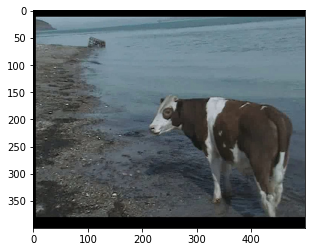

Greedy: dog runs on the beach


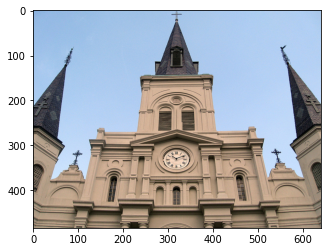

Greedy: man in blue shirt is sitting on the ground by the ocean


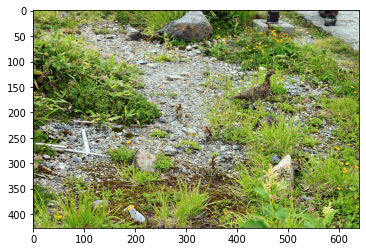

Greedy: man in red shirt is walking through the woods


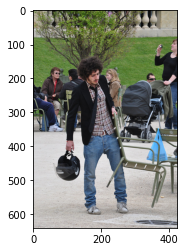

Greedy: man in blue shirt and jeans stands in front of crowd of people


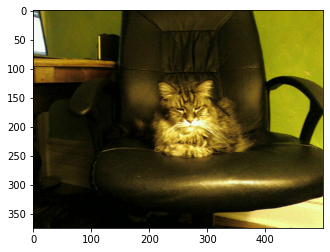

Greedy: two people are sitting on bed


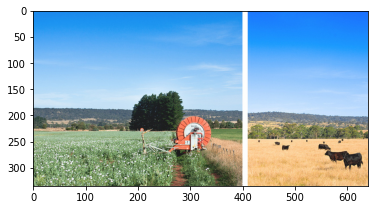

Greedy: man and dog run uphill hill


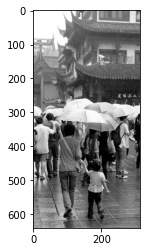

Greedy: two people are sitting on dock looking at something


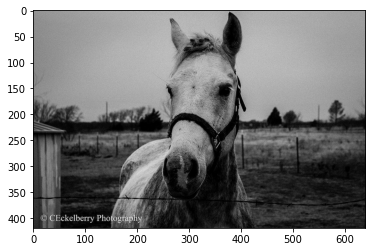

Greedy: two dogs are running through the grass


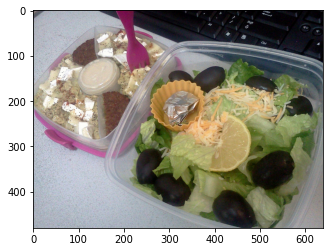

Greedy: dog is licking its head while standing in the grass


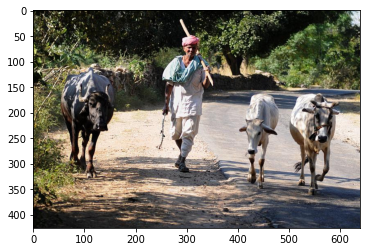

Greedy: group of people are riding horses


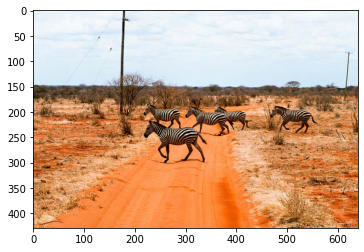

Greedy: two dogs are shaking each other on the grass


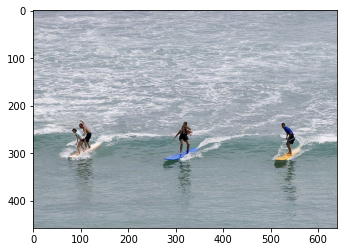

Greedy: boy in black wetsuit surfs in the ocean


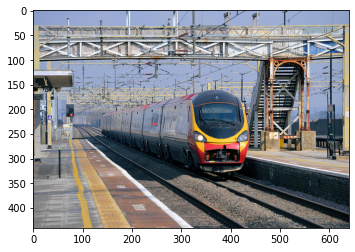

Greedy: the dog is running through the field


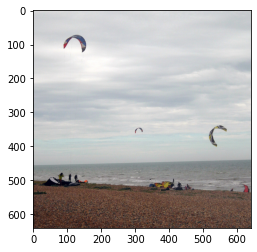

Greedy: person in red and yellow is being pulled by man in yellow watches


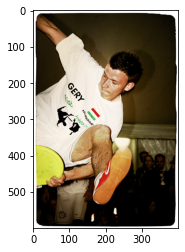

Greedy: little girl in pink dress is jumping on bed


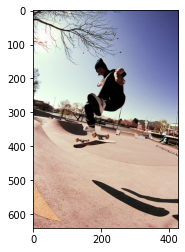

Greedy: skateboarder grinds rail


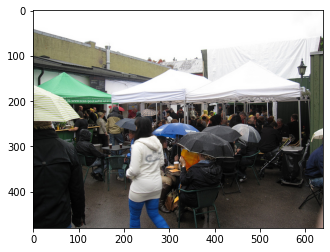

Greedy: man in black shirt and jeans is standing in front of some cardboard


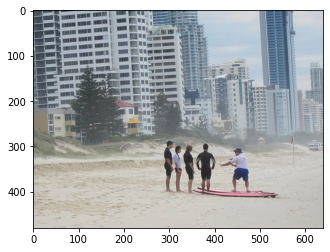

Greedy: four children are playing in the sand at the beach


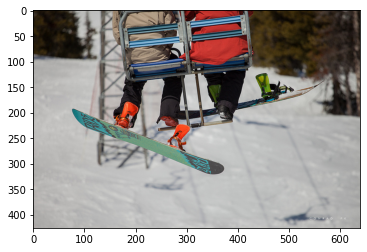

Greedy: man in red jacket is skiing down hill


In [ ]:
ids = []
results = []

for i in range(0,100):
  pic = list(encoding_test.keys())[i]
  image = encoding_test[pic].reshape((1,2048))
  x=plt.imread(s_images+pic)
  plt.imshow(x)
  plt.show()
  print("Greedy:",greedySearch(image))
  ids.append(pic)
  results.append(greedySearch(image))

In [ ]:
'''
import os
os.makedirs('results/imageCaptions' , exist_ok=True)
os.chdir('./results/imageCaptions')
'''

In [ ]:
'''
import pickle
with open('vanilla_lstm_result_ids2.pkl', 'wb') as f:
  pickle.dump(ids, f, protocol=2)

with open('vanilla_lstm_results2.pkl', 'wb') as f:
  pickle.dump(results, f, protocol=2)
'''